In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import warnings
import re

!jupyter nbextension enable --py widgetsnbextension
# Suppress all warnings
warnings.filterwarnings('ignore')

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/avocado-prices/avocado.csv


In [4]:
df = pd.read_csv("/kaggle/input/avocado-prices/avocado.csv")

## DATA SUMMARY

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB


In [61]:
df['average_revenue'] = df['AveragePrice'] * df['Total Volume']
df['average_revenue'] = df['average_revenue'].round(2)

In [62]:
df.head(5)

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,average_revenue
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,85434.70
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,74083.92
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,109944.80
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,85311.52
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,65330.69


In [42]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,18249.0,24.232232,1.548104e+01,0.00,10.00,24.00,38.00,52.00
AveragePrice,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25
Total Volume,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52
4046,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17
4225,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61
4770,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11
Total Bags,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37
Small Bags,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80
Large Bags,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61
XLarge Bags,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65


In [43]:
df.describe(include = ['O']).T

,count,unique,top,freq
Date,18249,169,2015-12-27,108
type,18249,2,conventional,9126
region,18249,54,Albany,338


In [63]:
regions_to_drop = ['TotalUS', 'West', 'GreatLakes', 'Northeast', 'Plains', 'SouthCentral', 'Southeast', "NorthernNewEngland", "Midsouth", "SouthCarolina", "WestTexNewMexico", "California" ]
df_filtered = df[~df['region'].isin(regions_to_drop)]
city_mapping = {
    'RaleighGreensboro': 'Raleigh',
    'NewOrleansMobile': 'New Orleans',
    'PhoenixTucson': 'Phoenix',
    'RichmondNorfolk': 'Richmond',
    'MiamiFtLauderdale': 'Miami',
    'BaltimoreWashington': 'Baltimore',
    'BuffaloRochester': 'Buffalo',
    'CincinnatiDayton': 'Cincinnati',
    'DallasFtWorth': 'Dallas',
    'HarrisburgScranton': 'Harrisburg',
    'HartfordSpringfield': 'Hartford'
}
def extract_city(region_name):
    return city_mapping.get(region_name, region_name)
# Apply the function to the 'region' column
df_filtered['region'] = df_filtered['region'].apply(extract_city)


In [64]:
df_filtered['region'].value_counts()

region
Albany          338
Raleigh         338
Nashville       338
New Orleans     338
NewYork         338
Orlando         338
Philadelphia    338
Phoenix         338
Pittsburgh      338
Portland        338
Richmond        338
Atlanta         338
Roanoke         338
Sacramento      338
SanDiego        338
SanFrancisco    338
Seattle         338
Spokane         338
StLouis         338
Syracuse        338
Miami           338
Louisville      338
LosAngeles      338
LasVegas        338
Baltimore       338
Boise           338
Boston          338
Buffalo         338
Charlotte       338
Chicago         338
Cincinnati      338
Columbus        338
Dallas          338
Denver          338
Detroit         338
GrandRapids     338
Harrisburg      338
Hartford        338
Houston         338
Indianapolis    338
Jacksonville    338
Tampa           338
Name: count, dtype: int64

In [66]:
!pip install meteostat

In [67]:
# !pip install meteostat
from datetime import datetime
from meteostat import Point, Daily

In [73]:
city_locations = {
    "Albany": Point(42.75, -73.1333),
    "Raleigh": Point(35.7796, -78.6382),
    "Nashville": Point(36.1627, -86.7816),
    "New Orleans": Point(29.9511, -90.0715),
    "NewYork": Point(40.7128, -74.0060),
    "Orlando": Point(28.5383, -81.3792),
    "Philadelphia": Point(39.9526, -75.1652),
    "Phoenix": Point(33.4484, -112.0740),
    "Pittsburgh": Point(40.4406, -79.9959),
    "Portland": Point(45.5152, -122.6784),
    "Richmond": Point(37.5407, -77.4360),
    "Atlanta": Point(33.7490, -84.3880),
    "Roanoke": Point(37.2709, -79.9414),
    "Sacramento": Point(38.5816, -121.4944),
    "SanDiego": Point(32.7157, -117.1611),
    "SanFrancisco": Point(37.7749, -122.4194),
    "Seattle": Point(47.6062, -122.3321),
    "Spokane": Point(47.6588, -117.4260),
    "StLouis": Point(38.6270, -90.1994),
    "Syracuse": Point(43.0481, -76.1474),
    "Miami": Point(25.7617, -80.1918),
    "Louisville": Point(38.2527, -85.7585),
    "LosAngeles": Point(34.0522, -118.2437),
    "LasVegas": Point(36.1699, -115.1398),
    "Baltimore": Point(39.2904, -76.6122),
    "Boise": Point(43.6150, -116.2023),
    "Boston": Point(42.3601, -71.0589),
    "Buffalo": Point(42.8864, -78.8784),
    "Charlotte": Point(35.2271, -80.8431),
    "Chicago": Point(41.8781, -87.6298),
    "Cincinnati": Point(39.1031, -84.5120),
    "Columbus": Point(39.9612, -82.9988),
    "Dallas": Point(32.7767, -96.7970),
    "Denver": Point(39.7392, -104.9903),
    "Detroit": Point(42.3314, -83.0458),
    "GrandRapids": Point(42.9634, -85.6681),
    "Harrisburg": Point(40.2732, -76.8867),
    "Hartford": Point(41.7637, -72.6851),
    "Houston": Point(29.7604, -95.3698),
    "Indianapolis": Point(39.7684, -86.1581),
    "Jacksonville": Point(30.3322, -81.6557),
    "Tampa": Point(27.9506, -82.4572)
}

In [74]:
import pandas as pd
from datetime import datetime
from meteostat import Point, Daily

def fetch_temperature(city, location, start_date, end_date):
    data = Daily(location, start_date, end_date).fetch()
    data.index = pd.to_datetime(data.index)  # Ensure index is in datetime format
    return data[['tavg', 'tmin', 'tmax']]


start = datetime(2015, 1, 4)
end = datetime(2018, 3, 25)

temperature_data = {}
for city, location in city_locations.items():
    temperature_data[city] = fetch_temperature(city, location, start, end)

# Convert Date column to datetime
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])

def get_city_temperature(city, date):
    if city in temperature_data:
        temp_data = temperature_data[city]
        temp_data = temp_data.loc[temp_data.index.date == date.date()]  # Match dates
        if not temp_data.empty:
            return temp_data[['tavg', 'tmin', 'tmax']].mean().mean()
    return None

df_filtered['Temperature'] = df_filtered.apply(lambda row: get_city_temperature(row['region'], row['Date']), axis=1)

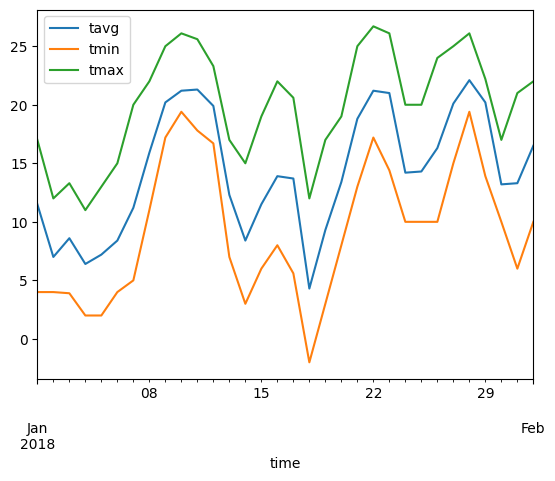

In [78]:
from datetime import datetime
import matplotlib.pyplot as plt
from meteostat import Point, Daily

# Set time period
start = datetime(2018, 1, 1)
end = datetime(2018, 2, 1)

# Create Point for Vancouver, BC
vancouver = Point(27.9506, -82.4572)

# Get daily data for 2018
data = Daily(vancouver, start, end)
data = data.fetch()

# Plot line chart including average, minimum and maximum temperature
data.plot(y=['tavg', 'tmin', 'tmax'])
plt.show()

## DATA PROFILING

In [14]:
# #  !pip install ydata-profiling
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="Profiling MPG Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## DATA ANALYSE - BIVARIATE AND MULTIVARIATE ANALYSIS, CORRELATION AND SCATTER PLOT MATRIX

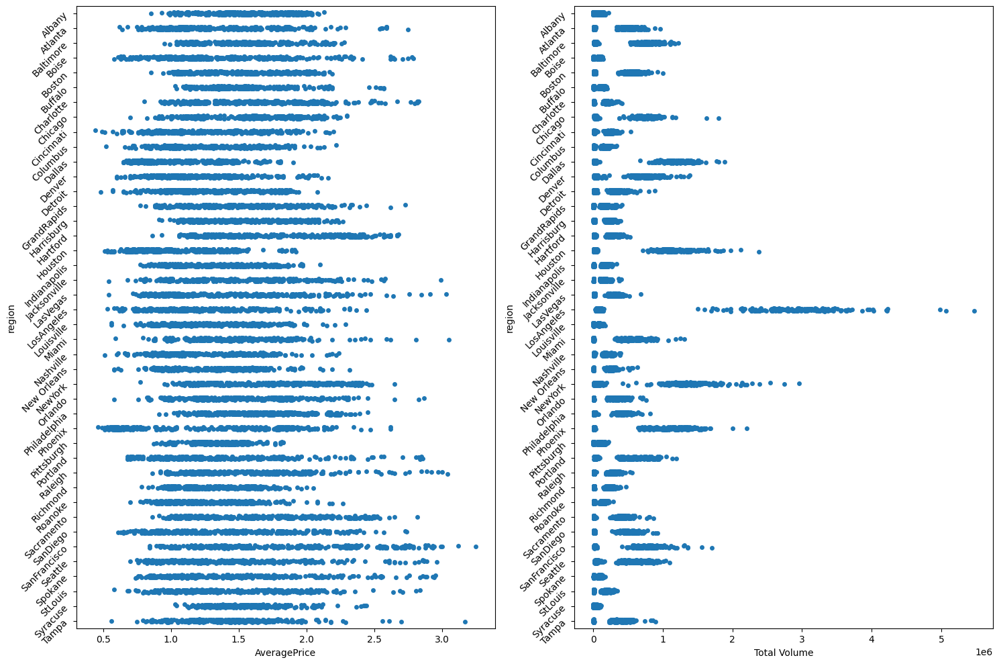

In [9]:
# Create a figure with 1 row and 2 columns (side-by-side layout)
fig, axes = plt.subplots(1, 2, figsize=(15, 10))  # Adjust the figsize to balance both plots

# Plot the first strip plot for AveragePrice
sns.stripplot(x='AveragePrice', y='region', data=df_filtered, ax=axes[0])

# Plot the second strip plot for Total Volume
sns.stripplot(x='Total Volume', y='region', data=df_filtered, ax=axes[1])

# Rotate the y-axis labels for both plots for better readability
for ax in axes:
    ax.set_yticklabels(ax.get_yticklabels(), rotation=45)

# Adjust the layout to prevent overlap
plt.tight_layout()

# Display the plots
plt.show()



<Figure size 1400x1200 with 0 Axes>

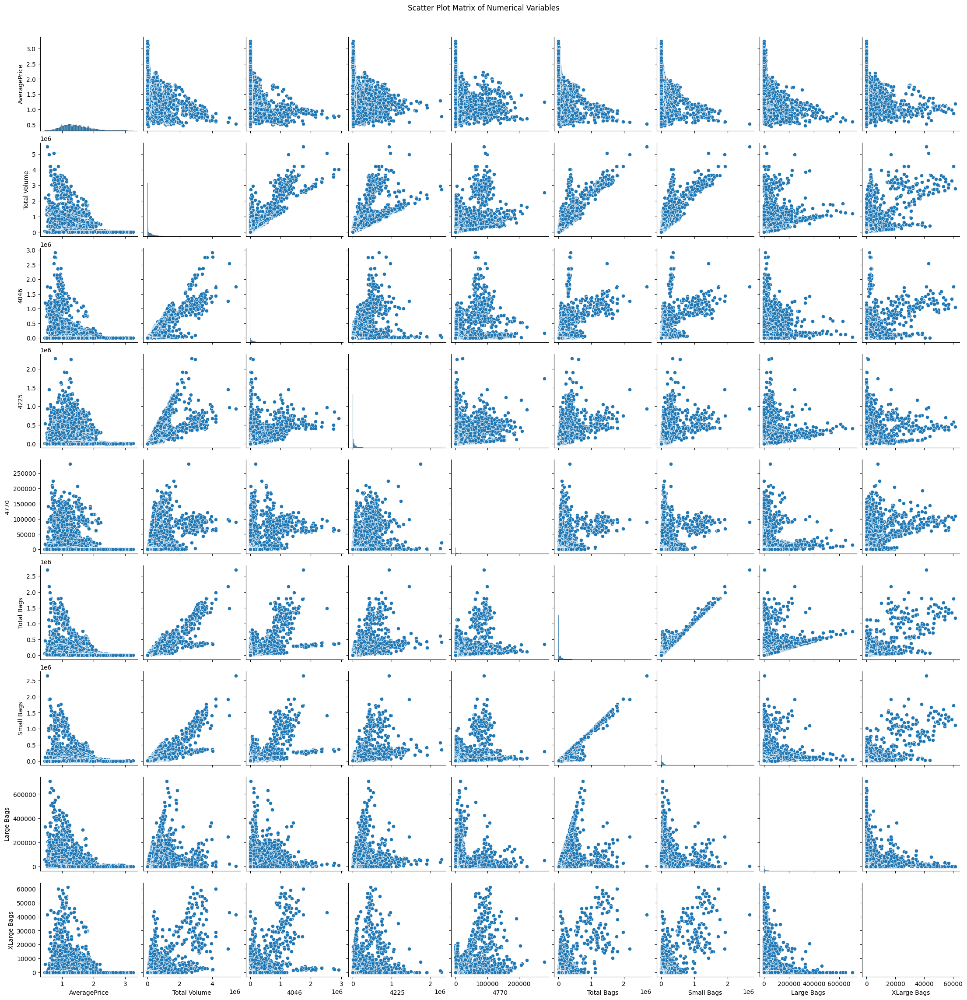

In [54]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load and prepare the data
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])

# Select numerical columns for the scatter plot matrix
numerical_columns = [
    'AveragePrice', 
    'Total Volume', 
    '4046', 
    '4225', 
    '4770', 
    'Total Bags', 
    'Small Bags', 
    'Large Bags', 
    'XLarge Bags'
]

# Create a subset of the data with only the numerical columns
df_numerical = df_filtered[numerical_columns]

# Create the scatter plot matrix (pair plot)
plt.figure(figsize=(14, 12))
sns.pairplot(df_numerical)
plt.suptitle('Scatter Plot Matrix of Numerical Variables', y=1.02)
plt.show()


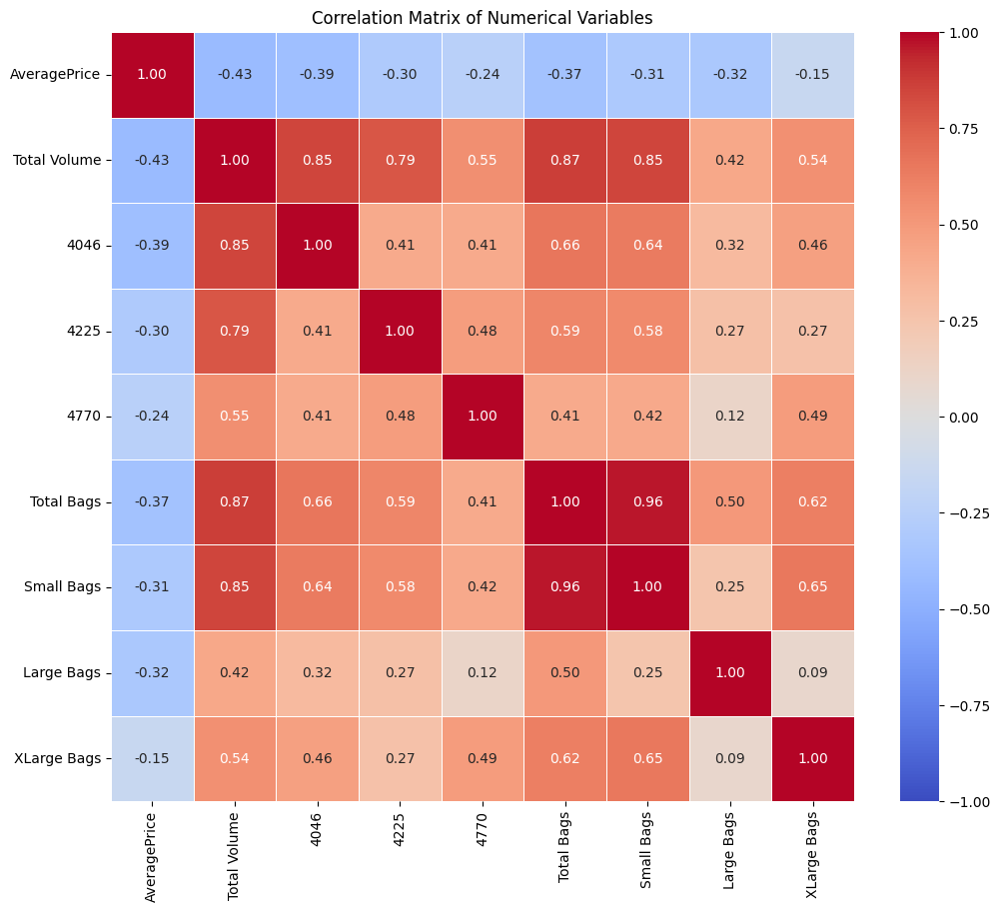

In [55]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load and prepare the data
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])

# Select numerical columns for the correlation matrix
numerical_columns = [
    'AveragePrice', 
    'Total Volume', 
    '4046', 
    '4225', 
    '4770', 
    'Total Bags', 
    'Small Bags', 
    'Large Bags', 
    'XLarge Bags'
]

# Create a subset of the data with only the numerical columns
df_numerical = df_filtered[numerical_columns]

# Compute the correlation matrix
correlation_matrix = df_numerical.corr()

# Plot the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, vmin=-1, vmax=1)
plt.title('Correlation Matrix of Numerical Variables')
plt.show()


## TIME SERIES AND AUTO_CORRELATION

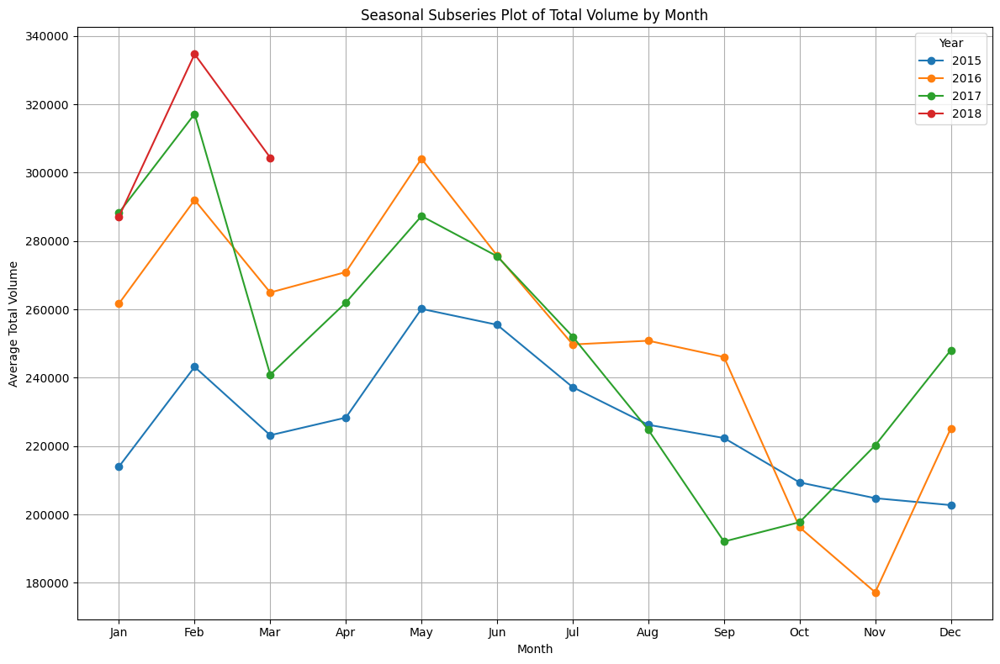

In [53]:
import pandas as pd
import matplotlib.pyplot as plt

# Load and prepare the data
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])
df_filtered['Month'] = df_filtered['Date'].dt.month
df_filtered['Year'] = df_filtered['Date'].dt.year

# Aggregate data by month and year
monthly_data = df_filtered.groupby(['Year', 'Month'])['Total Volume'].mean().reset_index()

# Pivot the data for plotting
pivot_data = monthly_data.pivot(index='Month', columns='Year', values='Total Volume')

# Plot the Seasonal Subseries Plot
plt.figure(figsize=(12, 8))
for year in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[year], marker='o', label=year)

plt.title('Seasonal Subseries Plot of Total Volume by Month')
plt.xlabel('Month')
plt.ylabel('Average Total Volume')
plt.xticks(ticks=range(1, 13), labels=[
    'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
])
plt.legend(title='Year')
plt.grid(True)
plt.tight_layout()
plt.show()


In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf

# Assuming df_filtered is your DataFrame
# If it's not defined, you should load your data here
# df_filtered = pd.read_csv('your_data.csv')

# Ensure 'Date' is in datetime format
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])

# Get unique avocado types and regions, and add 'All' option
types = ['All'] + list(df_filtered['type'].unique())
regions = ['All'] + list(df_filtered['region'].unique())

# Create dropdown widgets
type_dropdown = widgets.Dropdown(
    options=types,
    value='All',
    description='Type:',
    disabled=False,
)

region_dropdown = widgets.Dropdown(
    options=regions,
    value='All',
    description='Region:',
    disabled=False,
)

# Create a radio button widget for time aggregation
time_agg = widgets.RadioButtons(
    options=['Weekly', 'Monthly'],
    value='Weekly',
    description='Aggregation:',
    disabled=False
)

# Create an output widget to display the plot
out = widgets.Output()

def plot_autocorrelation(avocado_type, region, aggregation):
    with out:
        # Clear the previous plot
        plt.clf()
        
        # Filter data by the selected avocado type and region
        if avocado_type == 'All' and region == 'All':
            filtered_data = df_filtered
        elif avocado_type == 'All':
            filtered_data = df_filtered[df_filtered['region'] == region]
        elif region == 'All':
            filtered_data = df_filtered[df_filtered['type'] == avocado_type]
        else:
            filtered_data = df_filtered[(df_filtered['type'] == avocado_type) & (df_filtered['region'] == region)]
        
        # Aggregate data by week or month
        if aggregation == 'Weekly':
            agg_data = filtered_data.groupby([pd.Grouper(key='Date', freq='W-MON')])['Total Volume'].mean().reset_index()
            lags = 104
            lag_unit = 'week(s)'
            seasonal_lags = [4, 13, 26, 52]  # Monthly, Quarterly, Semi-annual, Annual
        else:  # Monthly
            agg_data = filtered_data.groupby([pd.Grouper(key='Date', freq='M')])['Total Volume'].mean().reset_index()
            lags = 38
            lag_unit = 'month(s)'
            seasonal_lags = [3, 6, 9, 12, 15, 18, 21, 24, 27, 30, 33, 36, 38]  # Quarterly, Semi-annual, Annual
        
        # Sort data by date and reset index
        agg_data = agg_data.sort_values('Date').reset_index(drop=True)
        
        # Calculate autocorrelation
        lag_acf = acf(agg_data['Total Volume'], nlags=lags)
        
        # Create subplots
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 12))
        
        # Plot time series
        ax1.plot(agg_data['Date'], agg_data['Total Volume'])
        ax1.set_title(f'{aggregation} Total Volume Time Series - {avocado_type} Type, {region} Region')
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Total Volume')
        
        # Plot autocorrelation
        plot_acf(agg_data['Total Volume'], lags=lags, ax=ax2)
        ax2.set_title(f'Autocorrelation of {aggregation} Total Volume - {avocado_type} Type, {region} Region')
        
        plt.tight_layout()
        plt.show()
        
        # Print some statistics
        print(f"Autocorrelation analysis for {avocado_type} type, {region} region ({aggregation.lower()} data):")
        print(f"First lag (lag 1) autocorrelation: {lag_acf[1]:.4f}")
        print(f"Highest autocorrelation: {max(lag_acf[1:])} at lag {lag_acf[1:].argmax() + 1} {lag_unit}")
        
        # Check for seasonality
        for lag in seasonal_lags:
            if lag < len(lag_acf):
                print(f"Autocorrelation at lag {lag} ({lag_unit}): {lag_acf[lag]:.4f}")

# Function to update plot based on dropdown and radio button selections
def update_plot(change):
    out.clear_output(wait=True)
    plot_autocorrelation(type_dropdown.value, region_dropdown.value, time_agg.value)

# Set up observers to update the plot when widget values change
type_dropdown.observe(update_plot, names='value')
region_dropdown.observe(update_plot, names='value')
time_agg.observe(update_plot, names='value')

# Display the widgets and the output
display(widgets.HBox([type_dropdown, region_dropdown, time_agg]), out)

# Display initial plot
plot_autocorrelation(type_dropdown.value, region_dropdown.value, time_agg.value)

Output()

## OUTLIERS AND MISSING VALUES

In [56]:
df.isna().sum()

Unnamed: 0      0
Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

<Axes: >

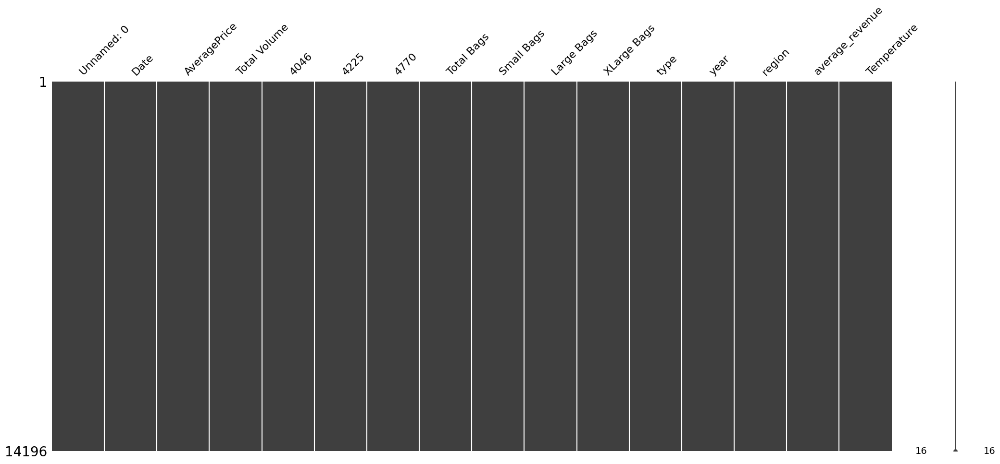

In [86]:
import missingno as msno
%matplotlib inline
msno.matrix(df_filtered)

In [57]:
import pandas as pd

# Load and prepare the data
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])

# Define a function to detect outliers based on IQR
def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]

# Identify outliers in Total Volume per region
outliers_per_region = df_filtered.groupby('region').apply(detect_outliers_iqr, 'Total Volume').reset_index(drop=True)

print("Outliers per region:")
print(outliers_per_region)


Outliers per region:
   Unnamed: 0       Date  AveragePrice  Total Volume       4046       4225  \
0           7 2018-02-04          0.67     880540.45  167512.70  287359.89   
1          47 2017-02-05          0.81     391313.63    1573.98  298897.77   
2           7 2018-02-04          0.88     408921.57    4371.02  193222.08   
3          47 2017-02-05          0.74     398543.91  191954.42   65200.84   
4          47 2017-02-05          0.79     893143.94  432114.92  200199.09   

        4770  Total Bags  Small Bags  Large Bags  XLarge Bags          type  \
0   60027.97   365639.89   266930.49    89516.48      9192.92  conventional   
1    8303.14    82538.74    78260.30     3910.85       367.59  conventional   
2  143538.35    67790.12    22315.79     1765.51     43708.82  conventional   
3     357.77   141030.88    64165.61    76520.83       344.44  conventional   
4     273.63   260556.30   150022.99   110241.64       291.67  conventional   

   year        region  Month  Year 

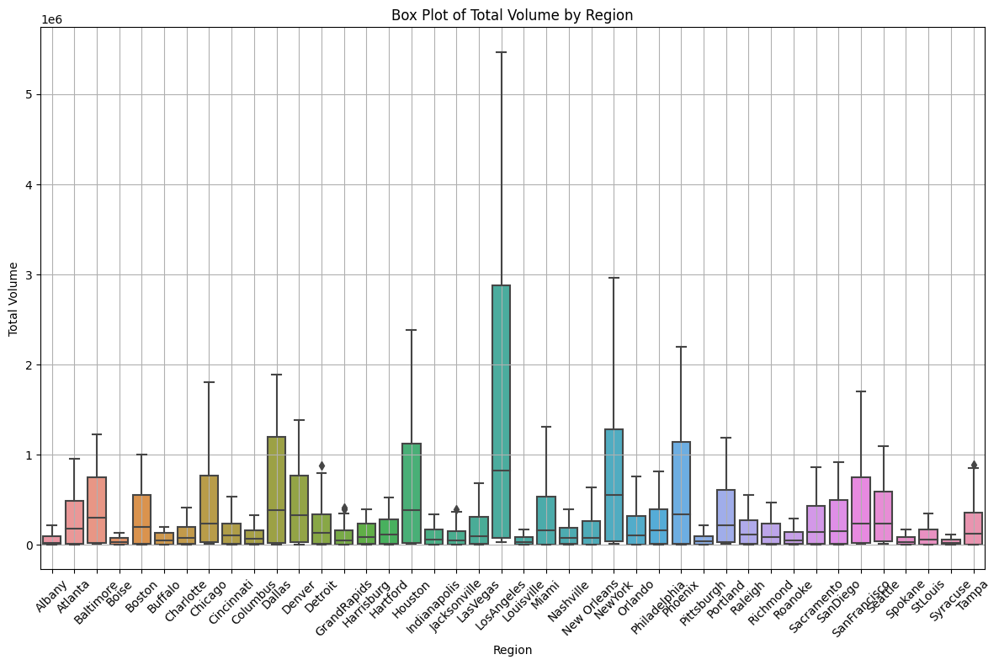

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

# Load and prepare the data
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])

# Plot box plot for Total Volume by region
plt.figure(figsize=(12, 8))
sns.boxplot(x='region', y='Total Volume', data=df_filtered)
plt.title('Box Plot of Total Volume by Region')
plt.xlabel('Region')
plt.ylabel('Total Volume')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


## PRE-PROCESSING DATA

In [ ]:
df.drop_duplicates(inplace = True)

In [ ]:
df['State'] = df['region'].map(city_to_state)